In [1]:
import pandas as pd
import sklearn
import numpy as np
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import dendrogram
import random
random.seed(1)

In [2]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')

# Dendrogram

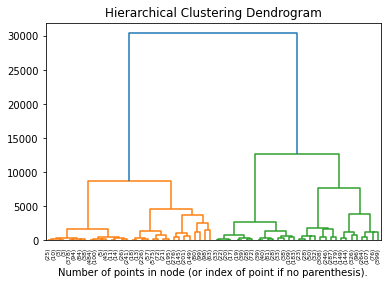

In [3]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(df)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level',p = 5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

# Let us see how many values are in each cluster for k = 2:

In [4]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')

hclustering = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward').fit(df)
df["clusters"] = hclustering.labels_
df.clusters.value_counts()

1    3849
0    3515
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [5]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')
# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = hclustering.labels_


In [6]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "Hierarchical clustering (k=2), 2 PCA components")
fig.show()

# 3D

In [7]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = hclustering.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "Hierarchical clustering (k=3), 3 PCA components")
fig.show()

## Table

In [8]:
# make sure that you run all the cells where k=2
C4 = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: red']*len(s)
    else:
        return ['background-color: purple']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 3:

In [8]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')
hclustering = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward').fit(df)
df["clusters"] = hclustering.labels_
df.clusters.value_counts()

0    3849
1    2714
2     801
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [9]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = hclustering.labels_


In [10]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "Hierarchical clustering (k=3), 2 PCA components")
fig.show()

### 3D

In [11]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')
# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = hclustering.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "Hierachical clustering (k=3), 3 PCA components")
fig.show()

## Table

In [13]:
# make sure that you run all the cells where k=3
C4 = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/C4_table_without_graphs.csv')merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: green']*len(s)
    elif s.clusters == 1:
        return ['background-color: purple']*len(s)
    else:
        return ['background-color: red']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 4:

In [12]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')
hclustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward').fit(df)
df["clusters"] = hclustering.labels_
df.clusters.value_counts()

0    2714
1    2288
3    1561
2     801
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [13]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = hclustering.labels_


In [14]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "Hierarchical clustering (k=4), 2 PCA components")
fig.show()

### 3D

In [15]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = hclustering.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "Hierarchical clustering (k=4), 3 PCA components")
fig.show()

## Table

In [18]:
# make sure that you run all the cells where k=4
C4 = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/C4_table_without_graphs.csv')merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: blue']*len(s)
    elif s.clusters == 1:
        return ['background-color: purple']*len(s)
    elif s.clusters == 2:
        return ['background-color: green']*len(s)
    else:
        return ['background-color: red']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 5:

In [16]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')
hclustering = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward').fit(df)
df["clusters"] = hclustering.labels_
df.clusters.value_counts()

0    2288
3    1561
1    1561
4    1153
2     801
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D 

In [17]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = hclustering.labels_


In [18]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "Hierarchical clustering (k=5), 2 PCA components")
fig.show()

### 3D

In [19]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = hclustering.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "Hierarchical clustering (k=5), 3 PCA components")
fig.show()

## Table

In [23]:
# make sure that you run all the cells where k=5
C4 = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: green']*len(s)
    elif s.clusters == 1:
        return ['background-color: orange']*len(s)
    elif s.clusters == 2:
        return ['background-color: blue']*len(s)
    elif s.clusters == 3:
        return ['background-color: purple']*len(s)
    else:
        return ['background-color: red']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 6:

In [20]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')
hclustering = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward').fit(df)
df["clusters"] = hclustering.labels_
df.clusters.value_counts()

3    1561
0    1561
5    1177
4    1153
1    1111
2     801
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [21]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = hclustering.labels_


In [22]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "Hierarchical clustering (k=6), 2 PCA components")
fig.show()

### 3D 

In [23]:
df = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/to_be_clustered_data_log.csv')# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = hclustering.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "Hierarchical clustering (k=6), 3 PCA components")
fig.show()

## Table

In [28]:
# make sure that you run all the cells where k=6
C4 = pd.read_csv('/home/lisi/Desktop/Uni/DataScience/FirstYear/SecondSemester/Seminar/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: orange']*len(s)
    elif s.clusters == 1:
        return ['background-color: blue']*len(s)
    elif s.clusters == 2:
        return ['background-color: green']*len(s)
    elif s.clusters == 3:
        return ['background-color: red']*len(s)
    elif s.clusters == 4:
        return ['background-color: cyan']*len(s)
    else:
        return ['background-color: purple']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)